In [6]:
import json
import random
import sys
import numpy as np
import pandas as pd
import matplotlib
from tqdm import tqdm
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx
from cartopy import crs as ccrs


def normalize_with_sign(lst):
    # 将列表转换为NumPy数组
    arr = np.array(lst)

    # 获取原始符号
    signs = np.sign(arr)

    # 取绝对值
    abs_arr = np.abs(arr)

    # 对绝对值进行log归一化处理
    log_arr = np.log1p(abs_arr)  # 使用log1p避免log(0)的情况

    # 将归一化后的值恢复到原始符号
    normalized_arr = log_arr * signs

    return normalized_arr.tolist()

date = '12-27'
city = 'Louisville'
file_name = f'KY_2021-{date}.csv'
safegraph_df = pd.read_csv(file_name)
condition = safegraph_df['city'] == 'Louisville'
poi_cbg = safegraph_df[condition]['poi_cbg'].tolist()
cbgs_list = list(set(poi_cbg))
cbgs_list = [str(x) for x in cbgs_list]

with open('Aij_KY_Louisville_12-27.json', 'r', encoding='utf-8') as f:
    Aij_dict = json.load(f)

matrix = np.array([value for value in Aij_dict.values()])
matrix[matrix > 0] = 1
print(len(matrix))

Aij_matrix = np.array(list(Aij_dict.values()))
row_sums = Aij_matrix.sum(axis=1)
column_sums = Aij_matrix.sum(axis=0)
jingliuchu = column_sums - row_sums
log_jingliuchu = normalize_with_sign(jingliuchu)

cbg = gpd.read_file("cbg.geojson")
# cbg_louisville = cbg[cbg['CensusBlockGroup'].isin(cbgs_list)]
cbg_louisville = cbg[cbg['CensusBlockGroup'].isin(cbgs_list)].set_index('CensusBlockGroup').reindex(cbgs_list).reset_index()

cbg_louisville["x"] = log_jingliuchu
cbg_louisville_wm = cbg_louisville.to_crs(epsg=3857)

df_aea_centroids = gpd.GeoDataFrame(geometry=cbg_louisville.geometry.centroid)
df_aea_centroids["x"] = jingliuchu
df_aea_centroids['color'] = np.where(df_aea_centroids['x'] > 0, "red", "blue")
df_aea_centroids_wm = df_aea_centroids.to_crs(epsg=3857)


579


/tmp/ipykernel_2513008/1814225972.py:61: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df_aea_centroids = gpd.GeoDataFrame(geometry=cbg_louisville.geometry.centroid)


In [8]:
import geopandas as gpd
import folium
from branca.colormap import linear
from branca.colormap import LinearColormap

non_zero_counts = []

# 遍历每一行
for row in matrix:
    # 统计该行中非零元素的数量
    count = sum(1 for x in row if x != 0)
    non_zero_counts.append(count)

# 假设您的 GeoDataFrame 变量名为 gdf
gdf = df_aea_centroids_wm  # 请确保这是正确的 GeoDataFrame 变量名
if len(non_zero_counts) != len(gdf):
    raise ValueError("列表长度必须与 GeoDataFrame 的行数一致！")

# non_zero_counts.sort(reverse=True)
print(non_zero_counts)
# 将列表添加到 GeoDataFrame 作为新列 'connection_num'
gdf['connection_num'] = non_zero_counts

# 1. 确保 x 列中的所有数值为正数
# 根据您的描述，x 列已经是正值（包括 0 和大于 0 的值），这里仅作检查和确保
gdf['x'] = gdf['x'].abs()  # 使用 abs() 确保所有值均为正数（虽然可能不需要）

# 2. 对 x 列应用对数变换
# 使用 np.log1p 来处理 x 值，避免 log(0) 的问题（log1p(x) = log(1 + x)）
gdf['x_log'] = np.log1p(gdf['x'])  # 创建一个新列 'x_log'，存储对数变换后的值

# 1. 检查并转换坐标系到 WGS84（EPSG:4326）
# Folium 需要经纬度坐标（WGS84），而您的 geometry 列可能是投影坐标系
if gdf.crs is None:
    # 如果 CRS 未定义，假设原始坐标系为 Web Mercator (EPSG:3857)
    gdf.set_crs('EPSG:3857', inplace=True)
if gdf.crs != 'EPSG:4326':
    gdf = gdf.to_crs('EPSG:4326')

# 2. 从 geometry 列提取经纬度
gdf['longitude'] = gdf['geometry'].x  # 提取经度
gdf['latitude'] = gdf['geometry'].y   # 提取纬度

# 3. 创建 Folium 地图
# 使用所有点的经纬度平均值作为地图中心
map_center = [gdf['latitude'].mean(), gdf['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=10)

# 4. 根据 x 列数值创建颜色映射
x_values = gdf['connection_num']
colormap = LinearColormap(
    colors=['#00008B', '#FF0000'],  # 深蓝色 (#00008B) 到深红色 (#FF0000)
    vmin=x_values.min(),
    vmax=x_values.max()
)
high_connection_points = {}
# 5. 为每个点添加实心圆（CircleMarker）
for idx, row in gdf.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],  # 点的位置
        radius=5,                                      # 圆的半径，可调整
        color='black',                                 # 边框颜色
        fill=True,                                     # 填充实心圆
        fill_color=colormap(row['connection_num']),                 # 根据 x 值设置填充颜色
        fill_opacity=0.7,                              # 填充透明度
        popup=f"connection_num: {row['connection_num']}"                         # 点击圆时显示 x 值
    ).add_to(m)

    if row['connection_num'] == 494:
        high_connection_points[idx] = {
            'latitude': row['latitude'],
            'longitude': row['longitude'],
            'connection_num': row['connection_num']
        }

print(high_connection_points)
# 6. 添加颜色条到地图
colormap.caption = 'X 值颜色条'  # 颜色条标题
colormap.add_to(m)

# 7. 保存地图为 HTML 文件
display(m)
# m.save('map_visualization.html')

# print("地图已生成并保存为 'map_visualization.html'，请在浏览器中打开查看。")

[5, 2, 0, 7, 127, 19, 13, 0, 18, 35, 80, 72, 165, 200, 156, 21, 87, 1, 3, 0, 0, 14, 1, 5, 4, 0, 27, 130, 24, 13, 81, 43, 39, 48, 9, 13, 0, 0, 0, 0, 202, 1, 118, 169, 35, 12, 2, 0, 4, 0, 0, 0, 143, 13, 39, 6, 19, 8, 77, 0, 6, 2, 111, 51, 55, 10, 5, 22, 9, 10, 23, 0, 34, 3, 43, 1, 39, 0, 2, 40, 28, 318, 138, 0, 375, 34, 1, 1, 2, 355, 15, 14, 14, 0, 3, 10, 34, 1, 50, 135, 10, 2, 20, 16, 90, 0, 1, 1, 8, 27, 9, 11, 0, 8, 0, 5, 0, 0, 54, 13, 28, 34, 47, 15, 0, 2, 64, 0, 1, 3, 9, 33, 2, 0, 45, 20, 1, 0, 6, 56, 0, 0, 31, 6, 21, 168, 15, 23, 0, 138, 56, 8, 155, 0, 4, 9, 1, 7, 16, 23, 20, 8, 14, 73, 10, 1, 1, 38, 40, 2, 2, 14, 0, 8, 32, 177, 8, 30, 3, 34, 58, 7, 0, 12, 494, 299, 49, 292, 8, 26, 22, 0, 95, 48, 101, 65, 0, 1, 6, 6, 14, 166, 20, 291, 98, 108, 2, 27, 21, 0, 20, 10, 17, 200, 180, 16, 5, 488, 28, 0, 18, 34, 75, 3, 11, 3, 3, 328, 70, 31, 4, 0, 11, 4, 11, 0, 3, 18, 6, 365, 2, 0, 58, 38, 3, 6, 22, 2, 2, 18, 11, 13, 3, 227, 48, 455, 350, 30, 0, 104, 102, 1, 22, 28, 127, 28, 0, 3, 38, 95, 

数据边界范围: x范围 [-9593126.547375338, -9495613.122469228], y范围 [4552037.372798224, 4638064.837506044]


100%|██████████| 579/579 [00:09<00:00, 62.74it/s] 


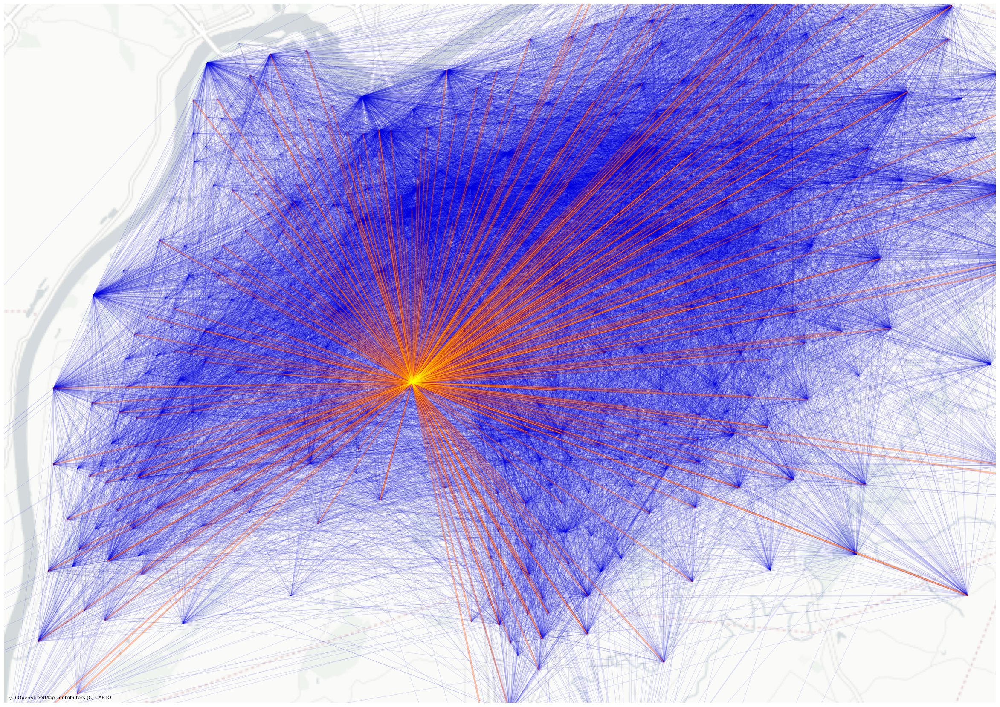

In [9]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.pyplot as plt
import contextily as cx
from tqdm import tqdm
import random

# 创建绘图，设置较大的图形大小以显示细节
ax = cbg_louisville_wm.plot(figsize=(30, 30), facecolor='none', edgecolor="none", legend=False)
ax.set_axis_off()

# 获取 cbg_louisville_wm 的边界范围
bounds = cbg_louisville_wm.total_bounds  # 返回 [minx, miny, maxx, maxy]
minx, miny, maxx, maxy = bounds

# 打印边界范围，帮助验证
print(f"数据边界范围: x范围 [{minx}, {maxx}], y范围 [{miny}, {maxy}]")

# 计算裁剪后的范围
x_range = maxx - minx
y_range = maxy - miny

# 保留 x 和 y 方向的部分区域
x_start = minx + (x_range * 0.3)  # 左边裁掉30%
x_end = maxx - (x_range * 0.2)      # 右边裁掉0%
y_start = miny + (y_range * 0.4)  # 下边裁掉40%
y_end = maxy - (y_range * 0.2)      # 上边裁掉0%

# 设置新的 x 和 y 范围
ax.set_xlim([x_start, x_end])
ax.set_ylim([y_start, y_end])

# 提取点的坐标
points = df_aea_centroids_wm.geometry
x_coords = points.x.reset_index(drop=True)
y_coords = points.y.reset_index(drop=True)

# 绘制连接线（仅当两个点中至少有一个在 high_connection_points 中时绘制）
for i in tqdm(range(len(matrix))):
    connected_points = [j for j in range(len(matrix[i])) if matrix[i][j] == 1]
    num_to_connect1 = max(1, int(len(connected_points) * 0.5))
    num_to_connect2 = max(1, int(len(connected_points) * 1))
    if num_to_connect1 > len(connected_points):
        num_to_connect1 = len(connected_points)
    if num_to_connect2 > len(connected_points):
        num_to_connect2 = len(connected_points)
    selected_points1 = random.sample(connected_points, num_to_connect1)
    selected_points2 = random.sample(connected_points, num_to_connect2)

    for j in selected_points1:
        # 检查点 i 或点 j 是否在 high_connection_points 中
        if i in high_connection_points or j in high_connection_points:
            # 仅当两个点中至少有一个在 high_connection_points 中时绘制连线
            ax.plot(
                [x_coords[i], x_coords[j]],
                [y_coords[i], y_coords[j]],
                color="#FF0000",
                linestyle="-",
                linewidth=3,
                alpha=0.25,
                zorder=9
            )
            ax.plot(
                [x_coords[i], x_coords[j]],
                [y_coords[i], y_coords[j]],
                color="#FFFF00",
                linestyle="-",
                linewidth=1,
                alpha=0.25,
                zorder=10
            )

    for j in selected_points2:
        # 检查点 i 或点 j 是否在 high_connection_points 中
        if i in high_connection_points or j in high_connection_points:
            None
        else:
            ax.plot(
            [x_coords[i], x_coords[j]],
            [y_coords[i], y_coords[j]],
            color="#0000df",
            linestyle="-",
            linewidth=1,
            alpha=0.1,
            zorder=5
            )

# 添加底图（确保与缩放后的 CRS 匹配）
cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels)
# cx.add_basemap(ax, source=cx.providers.CartoDB.PositronOnlyLabels)
plt.savefig('fig1a.png', format='png', bbox_inches='tight', pad_inches=0)
plt.show()

In [43]:
import geopandas as gpd
import folium
from branca.colormap import linear
from branca.colormap import LinearColormap

non_zero_counts = []

# 遍历每一行
for row in matrix:
    # 统计该行中非零元素的数量
    count = sum(1 for x in row if x != 0)
    non_zero_counts.append(count)

# 假设您的 GeoDataFrame 变量名为 gdf
gdf = df_aea_centroids_wm  # 请确保这是正确的 GeoDataFrame 变量名
if len(non_zero_counts) != len(gdf):
    raise ValueError("列表长度必须与 GeoDataFrame 的行数一致！")

# non_zero_counts.sort(reverse=True)
print(non_zero_counts)
# 将列表添加到 GeoDataFrame 作为新列 'connection_num'
gdf['connection_num'] = non_zero_counts

# 1. 确保 x 列中的所有数值为正数
# 根据您的描述，x 列已经是正值（包括 0 和大于 0 的值），这里仅作检查和确保
gdf['x'] = gdf['x'].abs()  # 使用 abs() 确保所有值均为正数（虽然可能不需要）

# 2. 对 x 列应用对数变换
# 使用 np.log1p 来处理 x 值，避免 log(0) 的问题（log1p(x) = log(1 + x)）
gdf['x_log'] = np.log1p(gdf['x'])  # 创建一个新列 'x_log'，存储对数变换后的值

# 1. 检查并转换坐标系到 WGS84（EPSG:4326）
# Folium 需要经纬度坐标（WGS84），而您的 geometry 列可能是投影坐标系
if gdf.crs is None:
    # 如果 CRS 未定义，假设原始坐标系为 Web Mercator (EPSG:3857)
    gdf.set_crs('EPSG:3857', inplace=True)
if gdf.crs != 'EPSG:4326':
    gdf = gdf.to_crs('EPSG:4326')

# 2. 从 geometry 列提取经纬度
gdf['longitude'] = gdf['geometry'].x  # 提取经度
gdf['latitude'] = gdf['geometry'].y   # 提取纬度

# 3. 创建 Folium 地图
# 使用所有点的经纬度平均值作为地图中心
map_center = [gdf['latitude'].mean(), gdf['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=10)

# 4. 根据 x 列数值创建颜色映射
x_values = gdf['connection_num']
colormap = LinearColormap(
    colors=['#00008B', '#FF0000'],  # 深蓝色 (#00008B) 到深红色 (#FF0000)
    vmin=x_values.min(),
    vmax=x_values.max()
)
high_connection_points = {}
# 5. 为每个点添加实心圆（CircleMarker）
for idx, row in gdf.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],  # 点的位置
        radius=5,                                      # 圆的半径，可调整
        color='black',                                 # 边框颜色
        fill=True,                                     # 填充实心圆
        fill_color=colormap(row['connection_num']),                 # 根据 x 值设置填充颜色
        fill_opacity=0.7,                              # 填充透明度
        popup=f"connection_num: {row['connection_num']}"                         # 点击圆时显示 x 值
    ).add_to(m)

    if row['connection_num'] == 494:
        high_connection_points[idx] = {
            'latitude': row['latitude'],
            'longitude': row['longitude'],
            'connection_num': row['connection_num']
        }

print(high_connection_points)
# 6. 添加颜色条到地图
colormap.caption = 'X 值颜色条'  # 颜色条标题
colormap.add_to(m)

# 7. 保存地图为 HTML 文件
display(m)
# m.save('map_visualization.html')

# print("地图已生成并保存为 'map_visualization.html'，请在浏览器中打开查看。")

[5, 2, 0, 7, 127, 19, 13, 0, 18, 35, 80, 72, 165, 200, 156, 21, 87, 1, 3, 0, 0, 14, 1, 5, 4, 0, 27, 130, 24, 13, 81, 43, 39, 48, 9, 13, 0, 0, 0, 0, 202, 1, 118, 169, 35, 12, 2, 0, 4, 0, 0, 0, 143, 13, 39, 6, 19, 8, 77, 0, 6, 2, 111, 51, 55, 10, 5, 22, 9, 10, 23, 0, 34, 3, 43, 1, 39, 0, 2, 40, 28, 318, 138, 0, 375, 34, 1, 1, 2, 355, 15, 14, 14, 0, 3, 10, 34, 1, 50, 135, 10, 2, 20, 16, 90, 0, 1, 1, 8, 27, 9, 11, 0, 8, 0, 5, 0, 0, 54, 13, 28, 34, 47, 15, 0, 2, 64, 0, 1, 3, 9, 33, 2, 0, 45, 20, 1, 0, 6, 56, 0, 0, 31, 6, 21, 168, 15, 23, 0, 138, 56, 8, 155, 0, 4, 9, 1, 7, 16, 23, 20, 8, 14, 73, 10, 1, 1, 38, 40, 2, 2, 14, 0, 8, 32, 177, 8, 30, 3, 34, 58, 7, 0, 12, 494, 299, 49, 292, 8, 26, 22, 0, 95, 48, 101, 65, 0, 1, 6, 6, 14, 166, 20, 291, 98, 108, 2, 27, 21, 0, 20, 10, 17, 200, 180, 16, 5, 488, 28, 0, 18, 34, 75, 3, 11, 3, 3, 328, 70, 31, 4, 0, 11, 4, 11, 0, 3, 18, 6, 365, 2, 0, 58, 38, 3, 6, 22, 2, 2, 18, 11, 13, 3, 227, 48, 455, 350, 30, 0, 104, 102, 1, 22, 28, 127, 28, 0, 3, 38, 95, 